In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
# Install required packages
!pip install -q transformers paddlepaddle paddleocr opencv-python-headless torch numpy scipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.3/73.3 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.2/48.2 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 6.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.8/192.8 MB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 59.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 61.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 34.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 32.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 

In [6]:
# Import libraries
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import random
import re
from transformers import TrOCRProcessor, VisionEncoderDecoderModel, MarianMTModel, MarianTokenizer
from paddleocr import PaddleOCR
import torch
from scipy.stats import entropy
import pandas as pd
from datasets import Dataset
from transformers import Seq2SeqTrainer, Seq2SeqTrainingArguments, DataCollatorForSeq2Seq


# Specify the data directory
data_dir = '/content/drive/MyDrive/data'
image_extensions = ['.jpg', '.jpeg', '.png']

# Create directory to save preprocessed images for debugging
os.makedirs('/content/preprocessed', exist_ok=True)

# List images and annotations
images = [f for f in os.listdir(data_dir) if os.path.splitext(f)[1].lower() in image_extensions]
annotations = [f for f in os.listdir(data_dir) if f.endswith('.txt')]

print(f"Total images: {len(images)}")
print(f"Total annotations: {len(annotations)}")

# Initialize PaddleOCR for text detection (used in scoring and OCR)
paddle_ocr = PaddleOCR(use_angle_cls=True, lang='en', use_gpu=torch.cuda.is_available())

# Initialize TrOCR
processor = TrOCRProcessor.from_pretrained("microsoft/trocr-small-printed")
model = VisionEncoderDecoderModel.from_pretrained("microsoft/trocr-small-printed")
model.eval()

# Initialize MarianMT model and tokenizer for English to Arabic translation
tokenizer = MarianTokenizer.from_pretrained("Helsinki-NLP/opus-mt-en-ar")
translation_model = MarianMTModel.from_pretrained("Helsinki-NLP/opus-mt-en-ar")
translation_model.eval()




/usr/local/lib/python3.11/dist-packages/paddle/utils/cpp_extension/extension_utils.py:711: UserWarning: No ccache found. Please be aware that recompiling all source files may be required. You can download and install ccache from: https://github.com/ccache/ccache/blob/master/doc/INSTALL.md
  warnings.warn(warning_message)


Total images: 501
Total annotations: 501
download https://paddleocr.bj.bcebos.com/PP-OCRv3/english/en_PP-OCRv3_det_infer.tar to /root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer/en_PP-OCRv3_det_infer.tar


100%|██████████| 3910/3910 [00:15<00:00, 253.60it/s] 


download https://paddleocr.bj.bcebos.com/PP-OCRv4/english/en_PP-OCRv4_rec_infer.tar to /root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer/en_PP-OCRv4_rec_infer.tar


100%|██████████| 10000/10000 [00:17<00:00, 569.20it/s]


download https://paddleocr.bj.bcebos.com/dygraph_v2.0/ch/ch_ppocr_mobile_v2.0_cls_infer.tar to /root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer/ch_ppocr_mobile_v2.0_cls_infer.tar


100%|██████████| 2138/2138 [00:14<00:00, 144.97it/s]

[2025/05/25 11:11:56] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, use_gcu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_l

preprocessor_config.json:   0%|          | 0.00/272 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


tokenizer_config.json:   0%|          | 0.00/327 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/238 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.21k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

Config of the encoder: <class 'transformers.models.deit.modeling_deit.DeiTModel'> is overwritten by shared encoder config: DeiTConfig {
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 384,
  "image_size": 384,
  "initializer_range": 0.02,
  "intermediate_size": 1536,
  "layer_norm_eps": 1e-12,
  "model_type": "deit",
  "num_attention_heads": 6,
  "num_channels": 3,
  "num_hidden_layers": 12,
  "patch_size": 16,
  "pooler_act": "tanh",
  "pooler_output_size": 384,
  "qkv_bias": true,
  "torch_dtype": "float32",
  "transformers_version": "4.51.3"
}

Config of the decoder: <class 'transformers.models.trocr.modeling_trocr.TrOCRForCausalLM'> is overwritten by shared decoder config: TrOCRConfig {
  "activation_dropout": 0.0,
  "activation_function": "relu",
  "add_cross_attention": true,
  "attention_dropout": 0.0,
  "bos_token_id": 0,
  "classifier_dropout": 0.0,
  "cross_attention_hidden_size": 384,
  "d_

generation_config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/44.0 [00:00<?, ?B/s]

source.spm:   0%|          | 0.00/801k [00:00<?, ?B/s]

target.spm:   0%|          | 0.00/917k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/2.12M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.39k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/308M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/308M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/293 [00:00<?, ?B/s]

MarianMTModel(
  (model): MarianModel(
    (shared): Embedding(62802, 512, padding_idx=62801)
    (encoder): MarianEncoder(
      (embed_tokens): Embedding(62802, 512, padding_idx=62801)
      (embed_positions): MarianSinusoidalPositionalEmbedding(512, 512)
      (layers): ModuleList(
        (0-5): 6 x MarianEncoderLayer(
          (self_attn): MarianAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (self_attn_layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (activation_fn): SiLU()
          (fc1): Linear(in_features=512, out_features=2048, bias=True)
          (fc2): Linear(in_features=2048, out_features=512, bias=True)
          (final_layer_norm): LayerNorm((512,), eps=1e-05

In [7]:
def is_image_file(filepath):
    """Check if the file is a valid image."""
    return os.path.splitext(filepath)[1].lower() in image_extensions

def is_alphanumeric_text(text):
    """Check if text contains letters, numbers, or alphanumeric combinations."""
    cleaned_text = text.strip()
    return bool(re.match(r'^[A-Za-z0-9\s\-]+$', cleaned_text)) and any(c.isalnum() for c in cleaned_text)

def preprocess_image(image):
    """Preprocess image to improve OCR accuracy."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(gray)
    return enhanced

def parse_annotation(file_path):
    """Parse annotation file to extract text."""
    try:
        with open(file_path, 'r') as file:
            text = file.read().strip()
            print(f"Annotation in {file_path}: '{text}'")
            return text if text else None
    except Exception as e:
        print(f"Error parsing {file_path}: {e}")
        return None


def translate(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True)
    if torch.cuda.is_available():
        inputs = {k: v.cuda() for k,v in inputs.items()}
        translation_model.cuda()
    output = translation_model.generate(**inputs)
    return tokenizer.decode(output[0], skip_special_tokens=True)


def compute_image_quality(image_path):
    """Compute quality score based on sharpness, contrast, resolution, and text presence."""
    try:
        image = cv2.imread(image_path)
        if image is None:
            return 0.0

        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        sharpness = cv2.Laplacian(gray, cv2.CV_64F).var()
        sharpness_norm = min(sharpness / 1000, 1.0)

        hist, _ = np.histogram(gray, bins=256, range=(0, 256))
        hist = hist / (hist.sum() + 1e-6)
        contrast = entropy(hist)
        contrast_norm = min(contrast / 10, 1.0)

        h, w = image.shape[:2]
        resolution = h * w
        resolution_norm = min(resolution / 1000000, 1.0)

        results = paddle_ocr.ocr(image_path, rec=False)
        text_count = len(results[0]) if results and results[0] else 0
        text_count_norm = min(text_count / 10, 1.0)

        score = 0.4 * sharpness_norm + 0.3 * contrast_norm + 0.2 * resolution_norm + 0.1 * text_count_norm
        return score
    except Exception as e:
        print(f"Error computing quality for {image_path}: {e}")
        return 0.0

def select_best_images(image_list, sample_size=10):
    """Select the top sample_size images based on quality score."""
    print("Computing quality scores for images...")
    scores = []
    for img_file in tqdm(image_list, desc="Scoring images"):
        img_path = os.path.join(data_dir, img_file)
        score = compute_image_quality(img_path)
        scores.append((img_file, score))

    scores.sort(key=lambda x: x[1], reverse=True)
    selected = [img_file for img_file, _ in scores[:sample_size]]
    print(f"Selected images: {selected}")
    return selected


In [8]:
def process_image(image_path):
    """Process an image to detect and extract alphanumeric text with annotations."""
    if not is_image_file(image_path):
        print(f"Error: '{image_path}' is not a valid image file.")
        return None, None, None

    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not load image '{image_path}'.")
        return None, None, None

    base_name = os.path.splitext(os.path.basename(image_path))[0]
    txt_file = os.path.join(data_dir, base_name + '.txt')
    annotation_text = parse_annotation(txt_file) if os.path.exists(txt_file) else None

    preprocessed = preprocess_image(image)
    preprocessed_bgr = cv2.cvtColor(preprocessed, cv2.COLOR_GRAY2BGR)

    preprocessed_path = f"/content/preprocessed/{base_name}_preprocessed.jpg"
    cv2.imwrite(preprocessed_path, preprocessed)
    print(f"Preprocessed image saved: {preprocessed_path}")

    quality_score = compute_image_quality(image_path)

    print(f"\nProcessing PaddleOCR for {image_path}")
    paddle_results = paddle_ocr.ocr(image_path, cls=True)
    detected_texts = []
    matched = False

    if paddle_results and paddle_results[0]:
        for line in paddle_results[0]:
            bbox, (text, confidence) = line[0], line[1]
            if len(text.strip()) < 1 or confidence < 0.1:
                continue
            print(f"PaddleOCR: '{text}' | Confidence: {confidence:.2f}")
            if is_alphanumeric_text(text):
                detected_texts.append(text)
                matched = True
                top_left = tuple(map(int, bbox[0]))
                bottom_right = tuple(map(int, bbox[2]))
                cv2.rectangle(image, top_left, bottom_right, (0, 255, 0), 2)
                cv2.putText(image, text, (top_left[0], top_left[1] - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
            else:
                print(f"Text '{text}' skipped (not alphanumeric)")

    if not matched:
        print("Trying TrOCR...")
        image_rgb = cv2.cvtColor(preprocessed, cv2.COLOR_GRAY2RGB)
        pixel_values = processor(image_rgb, return_tensors="pt").pixel_values
        if torch.cuda.is_available():
            pixel_values = pixel_values.cuda()
            model.cuda()
        generated_ids = model.generate(pixel_values)
        text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0].strip()
        if text and is_alphanumeric_text(text):
            print(f"TrOCR: '{text}'")
            detected_texts.append(text)
            matched = True
            h, w = image.shape[:2]
            cv2.rectangle(image, (50, 50), (w-50, h-50), (0, 255, 0), 2)
            cv2.putText(image, text[:50], (50, 40),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
        else:
            print(f"TrOCR: '{text}' (skipped, not alphanumeric or empty)")

    caption = f"Detected: {', '.join(detected_texts) if detected_texts else 'None'}; Annotation: {annotation_text if annotation_text else 'None'}; Quality Score: {quality_score:.2f}"
    if not matched:
        print(f"No alphanumeric text detected in {image_path}")

    return image, caption, quality_score, detected_texts


Computing quality scores for images...


Scoring images: 100%|██████████| 501/501 [02:51<00:00,  2.93it/s]


Selected images: ['74.jpg', '484.jpg', '312.jpg', '476.jpg', '181.jpg', '70.jpg', '97.jpg', '134.jpg', '367.jpg', '232.jpg']


Processing selected images and extracting text:   0%|          | 0/10 [00:00<?, ?it/s]

Annotation in /content/drive/MyDrive/data/74.txt: '0 0.6859375 0.8252173913043478 0.034375 0.04695652173913043
0 0.7640625 0.8017391304347826 0.03125 0.04869565217391304
0 0.75625 0.5243478260869565 0.025 0.04695652173913043
0 0.81875 0.7426086956521739 0.040625 0.05217391304347826
0 0.53203125 0.6643478260869565 0.0328125 0.04869565217391304
0 0.60703125 0.802608695652174 0.0359375 0.04695652173913043
0 0.8359375 0.6608695652173913 0.0375 0.04521739130434783
0 0.8140625 0.5834782608695652 0.0375 0.04695652173913043
0 0.5546875 0.7469565217391304 0.0375 0.04695652173913043
0 0.55234375 0.5860869565217391 0.0453125 0.04869565217391304
0 0.60390625 0.5269565217391304 0.0359375 0.04521739130434783
0 0.68046875 0.5052173913043478 0.0546875 0.04695652173913043'
Preprocessed image saved: /content/preprocessed/74_preprocessed.jpg

Processing PaddleOCR for /content/drive/MyDrive/data/74.jpg
[2025/05/25 11:15:36] ppocr DEBUG: dt_boxes num : 17, elapsed : 0.1586170196533203
[2025/05/25 11:15:37]

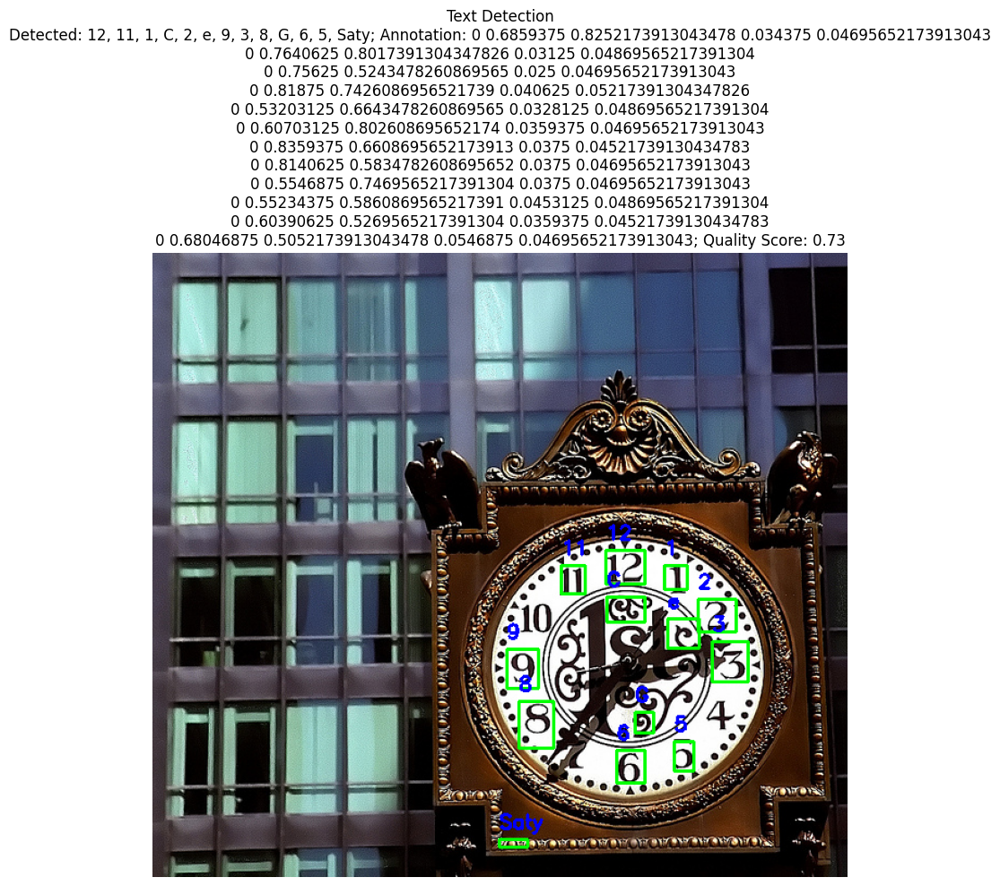

Processing selected images and extracting text:  10%|█         | 1/10 [00:04<00:37,  4.12s/it]

Annotation in /content/drive/MyDrive/data/484.txt: '0 0.9484375 0.75625 0.0625 0.03125
0 0.86015625 0.7546875 0.0890625 0.034375
0 0.884375 0.703125 0.20625 0.059375
0 0.79296875 0.7484375 0.0234375 0.03125
0 0.053125 0.4359375 0.103125 0.040625
0 0.92734375 0.8046875 0.0890625 0.03125
0 0.82109375 0.79453125 0.0546875 0.0359375
0 0.66484375 0.11796875 0.1703125 0.1015625
0 0.665625 0.075 0.06875 0.053125
0 0.6578125 0.0515625 0.159375 0.1
0 0.45625 0.52265625 0.0625 0.0203125
0 0.5296875 0.503125 0.040625 0.096875
0 0.30859375 0.4828125 0.0828125 0.034375
0 0.30625 0.515625 0.084375 0.034375
0 0.13984375 0.48203125 0.0265625 0.0171875
0 0.14296875 0.45703125 0.0390625 0.0171875
0 0.071875 0.4953125 0.05 0.01875
0 0.03515625 0.46640625 0.0671875 0.0359375
0 0.3140625 0.390625 0.05 0.14375
0 0.0625 0.30859375 0.078125 0.0265625
0 0.06796875 0.29765625 0.0828125 0.0328125
0 0.05703125 0.2734375 0.0984375 0.040625
0 0.059375 0.24921875 0.1 0.0453125
0 0.521875 0.15703125 0.025 0.1859375'


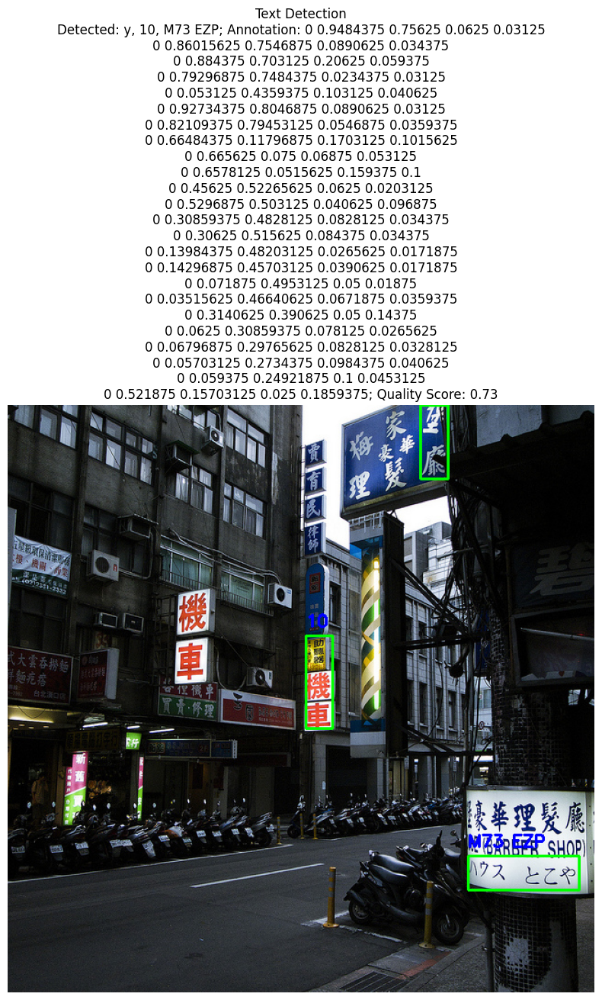

Processing selected images and extracting text:  20%|██        | 2/10 [00:08<00:32,  4.07s/it]

Annotation in /content/drive/MyDrive/data/312.txt: '0 0.5328125 0.28189300411522633 0.065625 0.037037037037037035
0 0.6671875 0.4567901234567901 0.053125 0.024691358024691357
0 0.6515625 0.5864197530864198 0.071875 0.0411522633744856
0 0.66171875 0.6213991769547325 0.0484375 0.0411522633744856
0 0.06328125 0.4547325102880658 0.0359375 0.02880658436213992
0 0.00625 0.3323045267489712 0.009375 0.06790123456790123
0 0.0265625 0.14609053497942387 0.046875 0.053497942386831275'
Preprocessed image saved: /content/preprocessed/312_preprocessed.jpg

Processing PaddleOCR for /content/drive/MyDrive/data/312.jpg
[2025/05/25 11:15:45] ppocr DEBUG: dt_boxes num : 10, elapsed : 0.18097376823425293
[2025/05/25 11:15:45] ppocr DEBUG: cls num  : 10, elapsed : 0.11530065536499023
[2025/05/25 11:15:45] ppocr DEBUG: rec_res num  : 10, elapsed : 0.7592320442199707
PaddleOCR: 'ois' | Confidence: 0.76
PaddleOCR: 'P' | Confidence: 0.97
PaddleOCR: 'x' | Confidence: 0.59
PaddleOCR: 'POLICE' | Confidence: 1.00
P

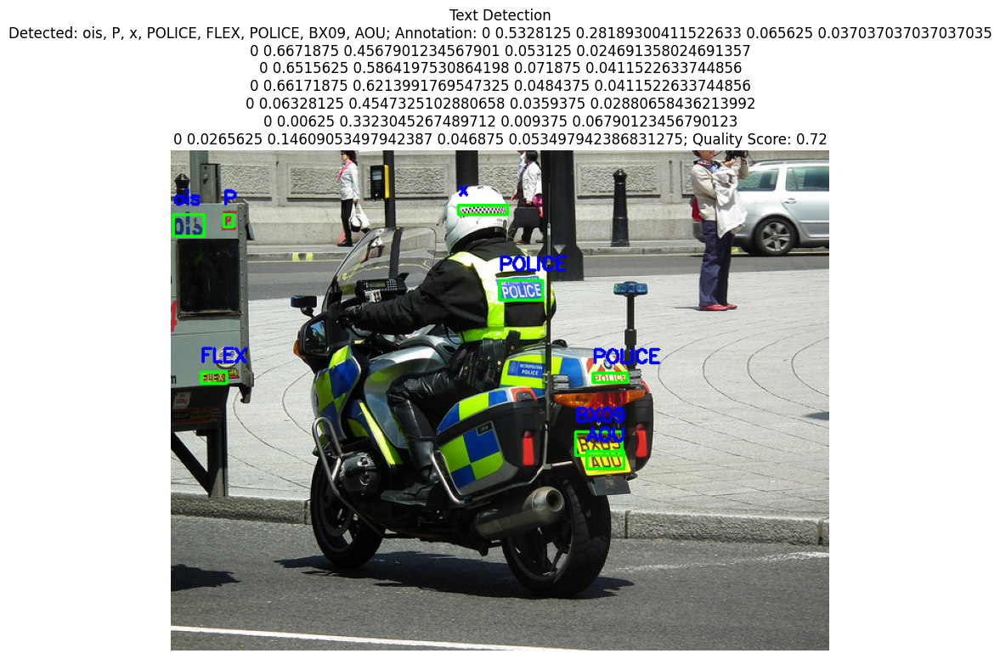

Processing selected images and extracting text:  30%|███       | 3/10 [00:10<00:23,  3.29s/it]

Annotation in /content/drive/MyDrive/data/476.txt: '0 0.5052083333333334 0.11484375 0.29375 0.0328125
0 0.39791666666666664 0.16015625 0.10833333333333334 0.0421875
0 0.6104166666666667 0.1578125 0.1125 0.0375
0 0.6854166666666667 0.45625 0.0625 0.028125
0 0.6895833333333333 0.484375 0.07916666666666666 0.028125
0 0.019791666666666666 0.50703125 0.035416666666666666 0.0546875
0 0.9572916666666667 0.82265625 0.04791666666666667 0.0109375
0 0.27708333333333335 0.70234375 0.05416666666666667 0.0109375
0 0.2989583333333333 0.6921875 0.04375 0.009375
0 0.46979166666666666 0.8109375 0.06875 0.01875
0 0.540625 0.78359375 0.03958333333333333 0.0140625
0 0.4947916666666667 0.7828125 0.03958333333333333 0.015625
0 0.45625 0.78359375 0.025 0.0140625
0 0.4239583333333333 0.78203125 0.027083333333333334 0.0140625
0 0.5083333333333333 0.7671875 0.075 0.015625
0 0.44583333333333336 0.7671875 0.041666666666666664 0.015625
0 0.55 0.7484375 0.016666666666666666 0.015625
0 0.5208333333333334 0.75 0.02916

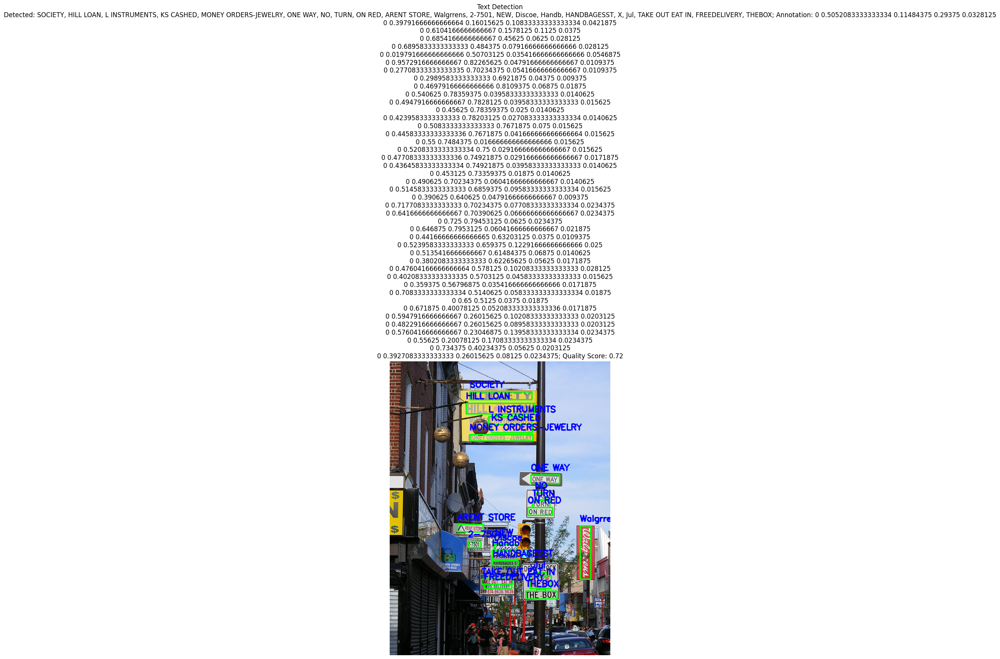

Processing selected images and extracting text:  40%|████      | 4/10 [00:16<00:25,  4.20s/it]

Annotation in /content/drive/MyDrive/data/181.txt: '0 0.290625 0.48020833333333335 0.040625 0.027083333333333334
0 0.58203125 0.49583333333333335 0.0359375 0.020833333333333332
0 0.73203125 0.04791666666666667 0.1265625 0.08333333333333333
0 0.7265625 0.12395833333333334 0.128125 0.11041666666666666
0 0.8515625 0.030208333333333334 0.078125 0.04791666666666667
0 0.85 0.06666666666666667 0.05 0.0375
0 0.9625 0.12916666666666668 0.0625 0.05
0 0.97265625 0.9791666666666666 0.0390625 0.020833333333333332
0 0.9234375 0.9802083333333333 0.0375 0.01875
0 0.8328125 0.9802083333333333 0.1375 0.01875
0 0.27265625 0.22083333333333333 0.0359375 0.025
0 0.28125 0.14791666666666667 0.05625 0.125
0 0.21875 0.203125 0.03125 0.09791666666666667
0 0.29921875 0.06666666666666667 0.0234375 0.025
0 0.27265625 0.07708333333333334 0.0203125 0.025
0 0.28984375 0.025 0.0515625 0.04583333333333333'
Preprocessed image saved: /content/preprocessed/181_preprocessed.jpg

Processing PaddleOCR for /content/drive/MyDr

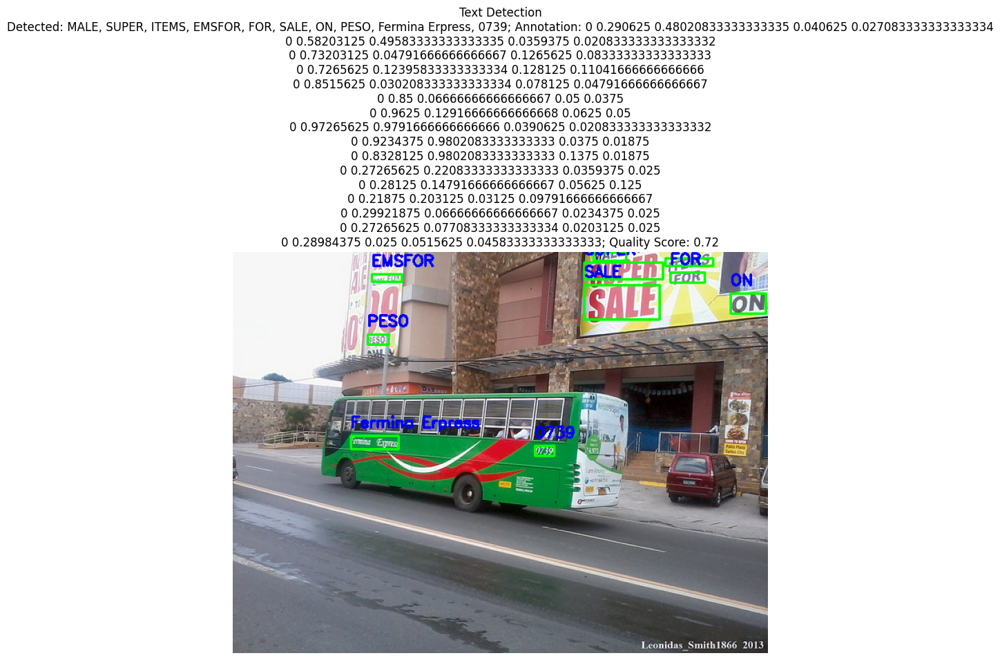

Processing selected images and extracting text:  50%|█████     | 5/10 [00:19<00:20,  4.02s/it]

Annotation in /content/drive/MyDrive/data/70.txt: '0 0.7020833333333333 0.20078125 0.0875 0.0421875
0 0.8125 0.17421875 0.09583333333333334 0.0390625
0 0.7552083333333334 0.21953125 0.12291666666666666 0.0484375
0 0.6895833333333333 0.26640625 0.09583333333333334 0.0359375
0 0.8125 0.2375 0.09166666666666666 0.034375
0 0.734375 0.8578125 0.22708333333333333 0.109375
0 0.7333333333333333 0.80625 0.25 0.11875
0 0.7479166666666667 0.709375 0.16666666666666666 0.09375
0 0.8145833333333333 0.65 0.07916666666666666 0.06875
0 0.7020833333333333 0.59453125 0.08333333333333333 0.0734375
0 0.5989583333333334 0.5 0.09375 0.065625
0 0.465625 0.55546875 0.16041666666666668 0.0984375
0 0.5364583333333334 0.49375 0.035416666666666666 0.03125
0 0.490625 0.51953125 0.03958333333333333 0.0234375
0 0.3885416666666667 0.20703125 0.16875 0.1515625
0 0.5385416666666667 0.30390625 0.12291666666666666 0.0984375
0 0.6322916666666667 0.3734375 0.06041666666666667 0.071875
0 0.540625 0.2671875 0.0520833333333333

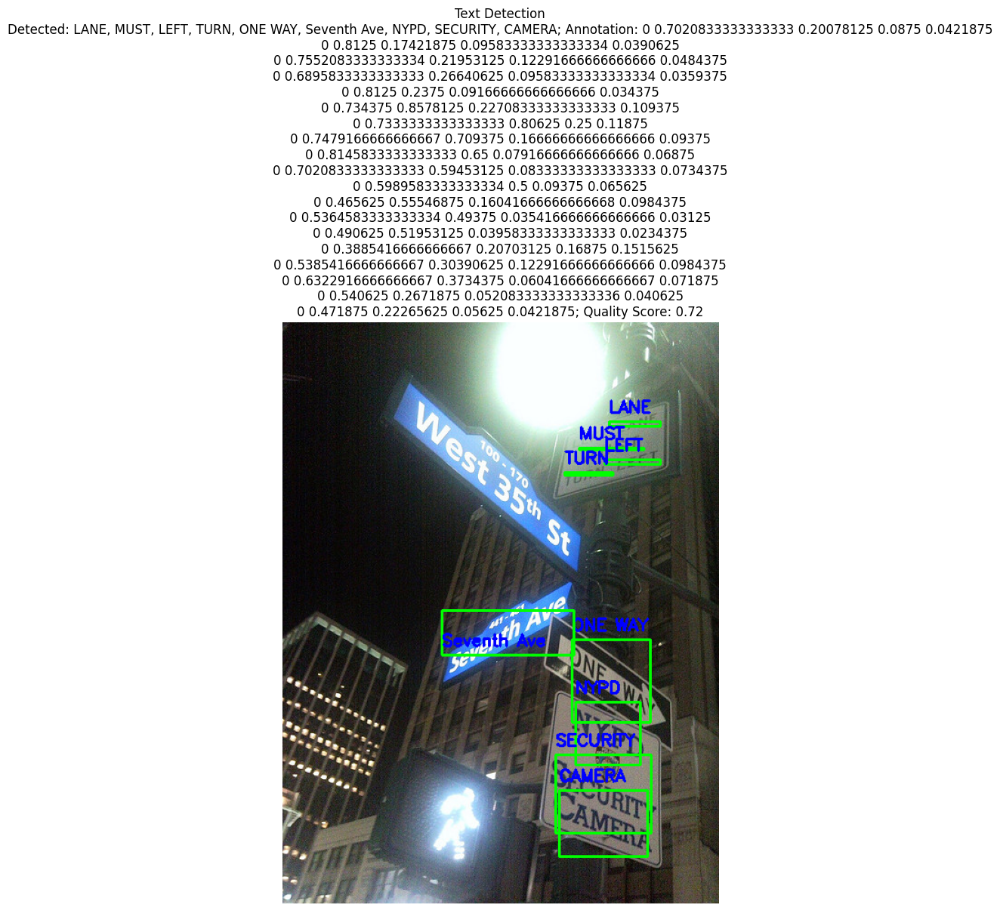

Processing selected images and extracting text:  60%|██████    | 6/10 [00:22<00:14,  3.73s/it]

Annotation in /content/drive/MyDrive/data/97.txt: '0 0.7020833333333333 0.24453125 0.075 0.0203125
0 0.059375 0.91875 0.11458333333333333 0.05625
0 0.06145833333333333 0.81171875 0.052083333333333336 0.0296875
0 0.6427083333333333 0.41484375 0.07291666666666667 0.0234375
0 0.68125 0.4359375 0.15416666666666667 0.034375
0 0.7083333333333334 0.4078125 0.041666666666666664 0.01875
0 0.8177083333333334 0.43828125 0.03125 0.0484375
0 0.6802083333333333 0.4890625 0.04375 0.040625
0 0.19895833333333332 0.4 0.16875 0.796875'
Preprocessed image saved: /content/preprocessed/97_preprocessed.jpg

Processing PaddleOCR for /content/drive/MyDrive/data/97.jpg
[2025/05/25 11:16:00] ppocr DEBUG: dt_boxes num : 10, elapsed : 0.24459505081176758
[2025/05/25 11:16:00] ppocr DEBUG: cls num  : 10, elapsed : 0.11621856689453125
[2025/05/25 11:16:01] ppocr DEBUG: rec_res num  : 10, elapsed : 0.8758459091186523
PaddleOCR: 'TATRA SKI' | Confidence: 0.94
PaddleOCR: 'triglav' | Confidence: 0.96
PaddleOCR: 'SDERATI

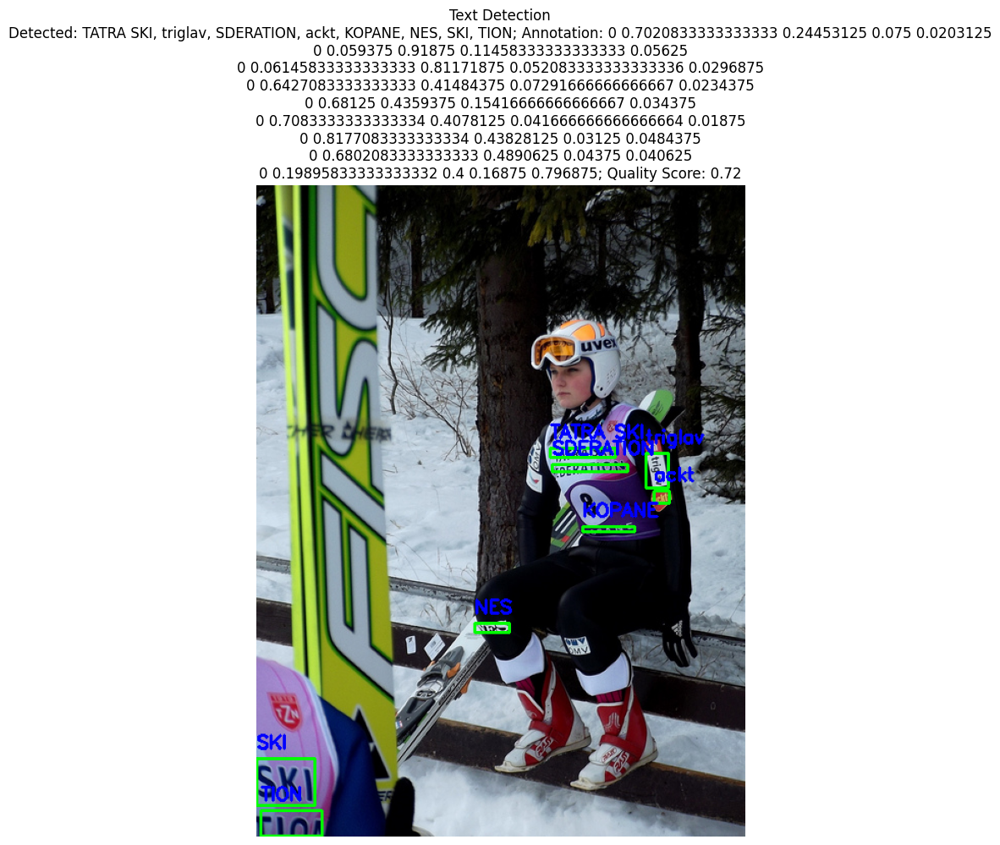

Processing selected images and extracting text:  70%|███████   | 7/10 [00:25<00:10,  3.37s/it]

Annotation in /content/drive/MyDrive/data/134.txt: '0 0.18125 0.5984375 0.15416666666666667 0.04375
0 0.196875 0.56640625 0.12291666666666666 0.0359375
0 0.446875 0.56796875 0.08958333333333333 0.0453125
0 0.75 0.51796875 0.058333333333333334 0.0484375
0 0.7677083333333333 0.52265625 0.035416666666666666 0.0296875
0 0.896875 0.565625 0.08958333333333333 0.03125
0 0.8864583333333333 0.5984375 0.11458333333333333 0.028125
0 0.56875 0.4203125 0.06666666666666667 0.025
0 0.36354166666666665 0.4578125 0.035416666666666666 0.021875
0 0.109375 0.46015625 0.09791666666666667 0.0203125
0 0.03125 0.59296875 0.058333333333333334 0.0171875
0 0.7864583333333334 0.42734375 0.03958333333333333 0.0328125
0 0.9510416666666667 0.34765625 0.09791666666666667 0.0515625
0 0.7895833333333333 0.38046875 0.10833333333333334 0.0484375
0 0.6364583333333333 0.553125 0.07708333333333334 0.021875
0 0.5697916666666667 0.56015625 0.04375 0.0171875'
Preprocessed image saved: /content/preprocessed/134_preprocessed.jpg

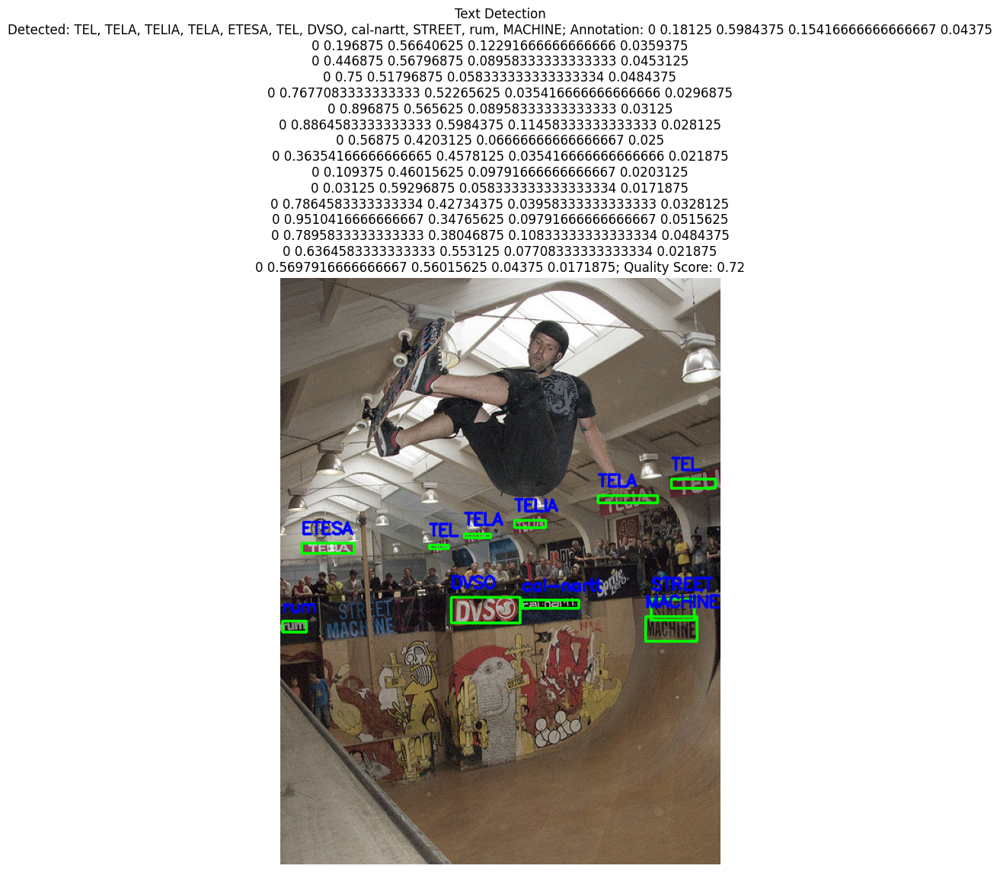

Processing selected images and extracting text:  80%|████████  | 8/10 [00:27<00:06,  3.03s/it]

Annotation in /content/drive/MyDrive/data/367.txt: '0 0.5927083333333333 0.31953125 0.03125 0.0171875
0 0.20208333333333334 0.19453125 0.06666666666666667 0.0421875
0 0.2520833333333333 0.27890625 0.041666666666666664 0.0265625
0 0.30416666666666664 0.23515625 0.075 0.0546875
0 0.46875 0.17265625 0.03333333333333333 0.0234375
0 0.5239583333333333 0.1859375 0.07291666666666667 0.053125
0 0.7822916666666667 0.2296875 0.10625 0.053125
0 0.7166666666666667 0.21796875 0.041666666666666664 0.0234375
0 0.778125 0.20859375 0.10208333333333333 0.0671875
0 0.784375 0.17890625 0.06041666666666667 0.0484375
0 0.7333333333333333 0.159375 0.09583333333333334 0.046875
0 0.6354166666666666 0.3140625 0.10416666666666667 0.05625
0 0.534375 0.3203125 0.035416666666666666 0.009375
0 0.7739583333333333 0.42109375 0.03958333333333333 0.0203125
0 0.5572916666666666 0.425 0.07708333333333334 0.01875
0 0.896875 0.31171875 0.035416666666666666 0.0109375
0 0.7697916666666667 0.32578125 0.13541666666666666 0.0484

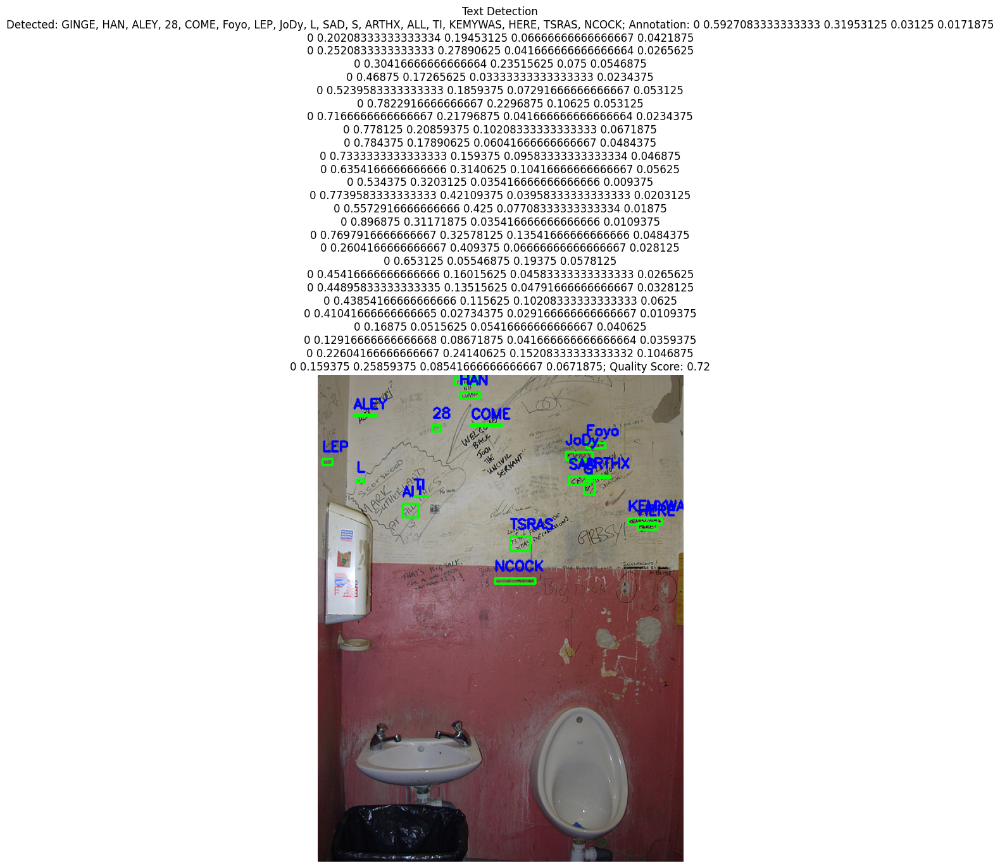

Processing selected images and extracting text:  90%|█████████ | 9/10 [00:33<00:03,  3.72s/it]

Annotation in /content/drive/MyDrive/data/232.txt: '0 0.56328125 0.30104166666666665 0.0328125 0.014583333333333334
0 0.521875 0.190625 0.046875 0.027083333333333334
0 0.571875 0.18333333333333332 0.04375 0.025
0 0.68515625 0.29583333333333334 0.0390625 0.016666666666666666
0 0.66015625 0.43020833333333336 0.0546875 0.022916666666666665
0 0.60546875 0.42291666666666666 0.0453125 0.025
0 0.64765625 0.39791666666666664 0.0140625 0.016666666666666666
0 0.59453125 0.39791666666666664 0.0109375 0.0125
0 0.73359375 0.1625 0.0515625 0.025
0 0.92734375 0.12916666666666668 0.0734375 0.03333333333333333
0 0.846875 0.13854166666666667 0.071875 0.03958333333333333
0 0.909375 0.2875 0.05 0.020833333333333332
0 0.8640625 0.28854166666666664 0.025 0.01875
0 0.88359375 0.4166666666666667 0.0171875 0.016666666666666666
0 0.96015625 0.4197916666666667 0.0203125 0.01875
0 0.9671875 0.4552083333333333 0.059375 0.022916666666666665
0 0.91640625 0.4510416666666667 0.0265625 0.01875'
Preprocessed image saved

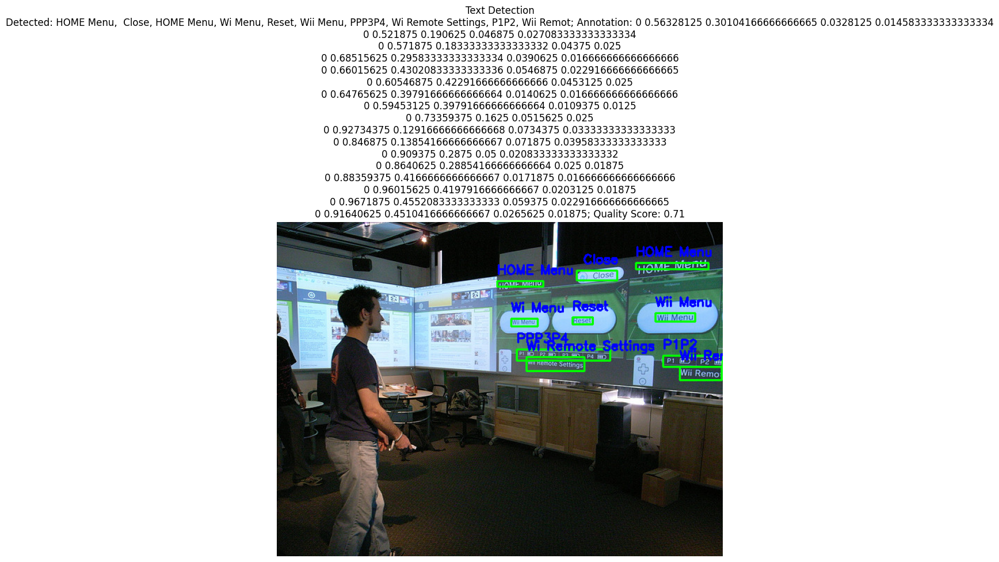

Processing selected images and extracting text: 100%|██████████| 10/10 [00:36<00:00,  3.69s/it]

Image: 312.jpg
EN: ois
AR: & & &
----------------------------------------
Image: 476.jpg
EN: SOCIETY
AR: المجتمع في مجتمع
----------------------------------------
Image: 181.jpg
EN: MALE
AR: من جانب جانب
----------------------------------------
Image: 70.jpg
EN: LANE
AR: الدولة الطرف
----------------------------------------
Image: 97.jpg
EN: TATRA SKI
AR: في تاريخ
----------------------------------------
Saved extracted translations to /content/en_ar.csv


In [9]:
# Select the best 10 images
selected_images = select_best_images(images, sample_size=10)

results = []
for img_file in tqdm(selected_images, desc="Processing selected images and extracting text"):
    image_path = os.path.join(data_dir, img_file)
    image, caption, quality_score, detected_texts = process_image(image_path)
    if image is not None:
        # Show image with annotations
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(10, 10))
        plt.imshow(image_rgb)
        plt.axis('off')
        plt.title(f"Text Detection\n{caption}", fontsize=12)
        plt.show()

        # Extract the first detected text (or empty)
        eng_text = detected_texts[0] if detected_texts else ""
        if eng_text:
            ar_text = translate(eng_text)
            results.append((img_file, eng_text, ar_text))

# Print some translated results as sample
for r in results[2:7]:
    print(f"Image: {r[0]}\nEN: {r[1]}\nAR: {r[2]}\n{'-'*40}")

#  Save Data for Fine-Tuning
df = pd.DataFrame(results, columns=["image", "en", "ar"])
csv_path = "/content/en_ar.csv"
df.to_csv(csv_path, index=False)
print(f"Saved extracted translations to {csv_path}")




In [10]:
# Prepare Dataset for Fine-Tuning
data = pd.read_csv(csv_path)
data = data[["en", "ar"]].dropna().drop_duplicates()
dataset = Dataset.from_pandas(data)

def preprocess(example):
    inputs = tokenizer(example["en"], truncation=True, padding="max_length", max_length=128)
    targets = tokenizer(example["ar"], truncation=True, padding="max_length", max_length=128)
    inputs["labels"] = targets["input_ids"]
    return inputs

tokenized_dataset = dataset.map(preprocess, batched=True)


#  Fine-Tune the Model
args = Seq2SeqTrainingArguments(
    output_dir="/content/opus-finetuned",
    per_device_train_batch_size=4,
    num_train_epochs=3,
    logging_dir="/content/logs",
    save_total_limit=1,
    save_steps=500,  # instead of save_strategy="epoch"
    logging_steps=100,
    fp16=False,
    report_to=[]  # disables wandb or hub logging
)

trainer = Seq2SeqTrainer(
    model=translation_model,
    args=args,
    train_dataset=tokenized_dataset,
    tokenizer=tokenizer,
    data_collator=DataCollatorForSeq2Seq(tokenizer, model=translation_model)
)

trainer.train()




Map:   0%|          | 0/7 [00:00<?, ? examples/s]

Step,Training Loss


TrainOutput(global_step=6, training_loss=4.304786046346028, metrics={'train_runtime': 54.0409, 'train_samples_per_second': 0.389, 'train_steps_per_second': 0.111, 'total_flos': 711865663488.0, 'train_loss': 4.304786046346028, 'epoch': 3.0})

In [11]:
# Test the fine-tuned model with a sample sentence
def test_translation(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True)
    if torch.cuda.is_available():
        inputs = {k: v.cuda() for k, v in inputs.items()}
        translation_model.cuda()
    outputs = translation_model.generate(**inputs)
    translated = tokenizer.decode(outputs[0], skip_special_tokens=True)
    return translated

sample_en = "This is a test sentence to check the fine-tuned translation model."
print("Test input:", sample_en)
print("Translated output:", test_translation(sample_en))

Test input: This is a test sentence to check the fine-tuned translation model.
Translated output: هذه جملة اختبارية لتفقد نموذج الترجمة المكمّل.
